In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd /content/drive/My Drive/single_cell_isoform_smoothing/

/content/drive/My Drive/single_cell_isoform_smoothing


In [3]:
!pip install --upgrade networkx
!pip install scanpy
!pip install SCORED

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 39.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.3/169.3 kB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 276.4/276.4 kB 26.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 89.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.0/80.0 kB 7.9 MB/s eta 0:00:00


In [4]:
import sklearn
import scipy
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from tqdm.notebook import tqdm
import networkx as nx
from scipy.stats import spearmanr
import numpy as np
import torch
import scanpy as sc
import pandas as pd
from scipy.sparse import csr_matrix
from anndata import AnnData
from typing import Optional, List
from scored import SCORED


In [5]:
def read_data(flowcell, dataset):
    adata_raw = sc.read_h5ad(
        f"./{dataset}_new/transcript_raw_{flowcell}.h5ad"
    )
    adata_refined = sc.read_h5ad(
        f"./{dataset}_new/transcript_new_{flowcell}.h5ad"
    )
    pseudotime_metadata = pd.read_csv(
        f'./{dataset}_new/meta_data_pseudotime.csv',
        index_col=0
    )

    adata_raw = adata_raw[adata_raw.obs.index.isin(pseudotime_metadata['cell_names'])]
    sc.pp.normalize_total(adata_raw, target_sum=1e4)

    adata_raw.obs['pseudotime'] = pseudotime_metadata.set_index('cell_names')['pseudotime'].loc[adata_raw.obs.index].values

    adata_refined = adata_refined[adata_refined.obs.index.isin(pseudotime_metadata['cell_names'])]
    adata_refined.obs['pseudotime'] = pseudotime_metadata.set_index('cell_names')['pseudotime'].loc[adata_refined.obs.index].values

    return adata_raw, adata_refined, pseudotime_metadata


In [6]:
import scanpy as sc
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors


def plot_isoform_expression_and_regression(adata_raw, adata_refined, isoform_names, lowess_frac=0.85):
    # color-blind safe
    RAW_LOWESS      = "#3B4CC0"
    RAW_SCATTER     = "#C8CDED"
    REFINED_LOWESS  = "#B40426"
    REFINED_SCATTER = "#EAB9C2"

    fig, axs = plt.subplots(2, len(isoform_names), figsize=(2 * len(isoform_names), 6),
                            dpi=256, sharex=True, sharey=True)



    for i, isoform_name in enumerate(isoform_names):
        raw_expr     = np.log1p(adata_raw[:, isoform_name].X.toarray().reshape(-1))
        refined_expr = adata_refined[:, isoform_name].X.toarray().reshape(-1)
        pseudotime   = adata_raw.obs['pseudotime'].to_numpy()

        q95  = np.nanpercentile(pseudotime, 95)
        mask = np.isfinite(pseudotime) & (pseudotime <= q95)

        pt   = pseudotime[mask]
        rex  = raw_expr[mask]
        fex  = refined_expr[mask]

        # smooth LOWESS fits
        raw_lowess     = sm.nonparametric.lowess(rex, pt, frac=lowess_frac, return_sorted=True)
        refined_lowess = sm.nonparametric.lowess(fex, pt, frac=lowess_frac, return_sorted=True)

        raw_lowess[:, 1]     = np.maximum(raw_lowess[:, 1], 0.0)
        refined_lowess[:, 1] = np.maximum(refined_lowess[:, 1], 0.0)

        axs[0, i].scatter(pt, rex, s=1, color=RAW_SCATTER, alpha=0.25, label='Original expression', rasterized=True)
        axs[0, i].plot(raw_lowess[:, 0], raw_lowess[:, 1], color=RAW_LOWESS, lw=2.0, label='LOWESS')

        axs[1, i].scatter(pt, fex, s=1, color=REFINED_SCATTER, alpha=0.25, label='Refined expression', rasterized=True)
        axs[1, i].plot(refined_lowess[:, 0], refined_lowess[:, 1], color=REFINED_LOWESS, lw=2.0, label='LOWESS')

        for r in (0, 1):
            axs[r, i].spines['right'].set_visible(False)
            axs[r, i].spines['top'].set_visible(False)

        axs[0, i].set_title(isoform_name)
        axs[1, i].set_xlabel('Pseudotime')

    axs[0, 0].set_ylabel('Original expression')
    axs[1, 0].set_ylabel('Refined expression')

    # legends once
    axs[0, len(isoform_names)-1].legend(loc='center left', bbox_to_anchor=(1.2, 1))
    axs[1, len(isoform_names)-1].legend(loc='center left', bbox_to_anchor=(1.2, 1))

    for ax in axs.flat:
        ax.set_ylim(0, 10)

    plt.show()


In [7]:
from collections import defaultdict
from scipy import sparse

def dominant_isoforms_from_markers(adata, activation_df, gene_col="gene", layer=None):
    """
    Returns (dominant_isoforms_list, mapping_df)

    dominant_isoforms_list: list of isoform feature names (e.g., 'CREM-207')
                            in the order of genes in activation_df, skipping genes not found.
    mapping_df: DataFrame with one row per found gene, including dominance details.
    """
    # 1) Choose matrix
    X = adata.layers[layer] if layer is not None else adata.X
    varnames = adata.var_names.astype(str).to_numpy()

    # 2) Precompute column sums once
    if sparse.issparse(X):
        col_sums = np.asarray(X.sum(axis=0)).ravel()
    else:
        col_sums = np.asarray(X).sum(axis=0)

    # 3) Map gene to column indices
    gene_to_cols = defaultdict(list)
    for j, feat in enumerate(varnames):
        if "-" in feat:
            gene_name, _iso = feat.rsplit("-", 1)
            gene_to_cols[gene_name].append(j)

    # 4) Iterate over marker genes in order
    genes = pd.unique(activation_df[gene_col].astype(str).str.strip())

    dom_list = []
    rows = []
    for g in genes:
        cols = gene_to_cols.get(g)
        if not cols:
            continue
        sums = col_sums[cols]
        j_rel = int(np.argmax(sums))
        j_abs = cols[j_rel]
        dom_feat = varnames[j_abs]
        total_for_gene = float(sums.sum())
        dom_score = float(sums[j_rel])
        frac = (dom_score / total_for_gene) if total_for_gene > 0 else np.nan

        dom_list.append(dom_feat)
        rows.append({
            "gene": g,
            "dominant_isoform": dom_feat,
            "dominant_sum": dom_score,
            "gene_sum": total_for_gene,
            "n_isoforms": len(cols),
            "dominance_fraction": frac
        })

    mapping_df = pd.DataFrame(rows, columns=[
        "gene","dominant_isoform","dominant_sum","gene_sum","n_isoforms","dominance_fraction"
    ])
    return dom_list, mapping_df




In [8]:
from collections import defaultdict
from scipy import sparse

def dominant_isoforms_all_genes(adata, layer=None, drop_zeros=False):

    X = adata.layers[layer] if layer is not None else adata.X
    varnames = adata.var_names.astype(str).to_numpy()

    if sparse.issparse(X):
        col_sums = np.asarray(X.sum(axis=0)).ravel()
    else:
        col_sums = np.asarray(X).sum(axis=0)

    gene_to_cols = defaultdict(list)
    gene_first_idx = {}
    for j, feat in enumerate(varnames):
        if "-" in feat:
            gene, _iso = feat.rsplit("-", 1)
        else:
            gene = feat
        gene_to_cols[gene].append(j)
        if gene not in gene_first_idx:
            gene_first_idx[gene] = j

    rows = []
    for g, cols in gene_to_cols.items():
        sums = col_sums[cols]
        gene_total = float(sums.sum())
        if drop_zeros and gene_total <= 0:
            continue
        j_rel = int(np.argmax(sums))
        j_abs = cols[j_rel]
        dom_feat = varnames[j_abs]
        dom_sum = float(sums[j_rel])
        frac = (dom_sum / gene_total) if gene_total > 0 else np.nan
        rows.append({
            "gene": g,
            "dominant_isoform": dom_feat,
            "dominant_sum": dom_sum,
            "gene_sum": gene_total,
            "n_isoforms": len(cols),
            "dominance_fraction": frac,
            "_order": gene_first_idx[g],
        })

    mapping_df = (pd.DataFrame(rows)
                    .sort_values("_order")
                    .drop(columns="_order")
                    .reset_index(drop=True))
    dom_list = mapping_df["dominant_isoform"].tolist()
    return dom_list, mapping_df

In [9]:
import numpy as np
import pandas as pd
from scipy import sparse, stats
import statsmodels.api as sm
from statsmodels.stats.multitest import multipletests
from patsy import dmatrix

def de_along_pseudotime_spline(
    adata,
    features,
    pseudotime_col="pseudotime",
    layer=None,
    df_spline=5,
    min_cells_expr=10,
    trim_top=None,
    eps_direction=0.0
):

    Xbase = adata.layers[layer] if layer is not None else adata.X
    pt_all = adata.obs[pseudotime_col].to_numpy()

    mask = np.isfinite(pt_all)
    if trim_top is not None and trim_top > 0:
        q = np.nanpercentile(pt_all[mask], 100 * (1 - trim_top))
        mask &= pt_all <= q

    pt = pt_all[mask]
    n_obs = pt.size
    if n_obs < (df_spline + 3):
        raise ValueError("Too few cells after filtering to fit the spline model.")

    X_spline = dmatrix(
        f"bs(x, df={df_spline}, degree=3, include_intercept=False)",
        {"x": pt}, return_type='dataframe'
    ).to_numpy()
    X_full = np.hstack([np.ones((n_obs, 1)), X_spline])
    X_null = np.ones((n_obs, 1))
    p = X_spline.shape[1]

    rows = []
    varnames = adata.var_names.astype(str)
    for feat in features:
        if feat not in varnames:
            continue
        col = adata[:, feat].X
        y = (col.toarray().ravel() if sparse.issparse(col) else np.asarray(col).ravel())
        y = y[mask]

        valid = np.isfinite(y)
        if valid.sum() <= (p + 2):
            continue

        yv  = y[valid]
        ptv = pt[valid]
        Xf  = X_full[valid, :]
        Xn  = X_null[valid, :]

        n_expr = int(np.sum(yv > 0))
        if n_expr < min_cells_expr:
            continue

        try:
            fit_full = sm.OLS(yv, Xf).fit()
            fit_null = sm.OLS(yv, Xn).fit()
        except Exception:
            continue

        RSS1 = float(np.sum(fit_full.resid**2))
        RSS0 = float(np.sum(fit_null.resid**2))
        df1  = p
        df2  = len(yv) - (p + 1)

        F = ((RSS0 - RSS1) / df1) / (RSS1 / df2) if (RSS1 > 0 and df2 > 0) else np.nan
        p_spline = stats.f.sf(F, df1, df2) if np.isfinite(F) else np.nan
        partial_R2 = 1 - RSS1 / RSS0 if RSS0 > 0 else np.nan

        med = np.nanmedian(ptv)
        lo_mask = ptv <  med
        hi_mask = ptv >= med
        if lo_mask.sum() == 0 or hi_mask.sum() == 0:
            direction_sign, direction, delta_mean = 0, "flat", 0.0
        else:
            m_lo = float(np.mean(yv[lo_mask]))
            m_hi = float(np.mean(yv[hi_mask]))
            delta_mean = m_hi - m_lo
            direction_sign = 1 if delta_mean >  eps_direction else (-1 if delta_mean < -eps_direction else 0)
            direction = "increase" if direction_sign > 0 else ("decrease" if direction_sign < 0 else "flat")

        rows.append({
            "feature": feat,
            "n": int(len(yv)),
            "n_expr": n_expr,
            "spline_df": df1,
            "F": F,
            "p_spline": p_spline,
            "partial_R2": partial_R2,
            "direction_sign": direction_sign,
            "direction": direction,
            "delta_mean": delta_mean
        })

    res = pd.DataFrame(rows).sort_values("p_spline", na_position="last")
    if not res.empty:
        res["q_spline"] = multipletests(res["p_spline"].values, method="fdr_bh")[1]
        res["DE_along_pseudotime"] = res["q_spline"] < 0.05
    return res



In [10]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def plot_isoform_2x2(
    adata_dict, isoform, ylim=None, xlim=None,
    drop_top_pct=0.05, use_global_cut=True, sharey=False
):
    colors = {'with_pge2': '#E41A1C', 'no_pge2': '#377EB8'}
    conds  = ['no_pge2', 'with_pge2']
    phases = ['raw', 'refined']

    phase_labels = {'raw': 'Original', 'refined': 'Refined'}
    cond_labels  = {'with_pge2': 'IL1B+IL23+PGE2', 'no_pge2': 'IL1B+IL23'}

    all_x = []
    for cond in conds:
        adata_raw, adata_refined = adata_dict[cond]
        all_x.append(adata_raw.obs['pseudotime'])
        all_x.append(adata_refined.obs['pseudotime'])
    all_x = pd.concat(all_x)

    if xlim is None:
        xmin = float(all_x.min())
        xmax_base = float(all_x.max())
        if drop_top_pct and use_global_cut:
            xmax = float(all_x.quantile(1 - drop_top_pct))
        else:
            xmax = xmax_base
        xlim = (xmin, xmax)

    fig, axes = plt.subplots(2, 2, figsize=(8, 6), dpi=200, sharex=True, sharey=sharey)

    for i, phase in enumerate(phases):
        for j, cond in enumerate(conds):
            ax = axes[i, j]
            adata_raw, adata_refined = adata_dict[cond]
            adata = adata_raw if phase == 'raw' else adata_refined

            if isoform not in adata.var_names:
                ax.text(0.5, 0.5, f"{isoform} not found", ha='center', va='center')
                ax.set_axis_off()
                continue

            x_series = adata.obs['pseudotime']
            if drop_top_pct:
                cutoff = xlim[1] if use_global_cut else float(x_series.quantile(1 - drop_top_pct))
                mask = x_series <= cutoff
                ad = adata[mask].copy()
            else:
                ad = adata

            expr = ad.obs_vector(isoform)
            if phase == 'raw':
                expr = np.log1p(expr)
            x = ad.obs['pseudotime'].to_numpy()

            sns.scatterplot(x=x, y=expr, ax=ax, s=5, color=colors[cond],
                            alpha=0.3, linewidth=0, zorder=1)
            sns.kdeplot(x=x, y=expr, ax=ax, fill=True,
                        levels=5, thresh=0.05, cut=0,
                        color=colors[cond], alpha=0.6)

            base_rgb = mcolors.to_rgb(colors[cond])
            darker_hex = mcolors.to_hex(tuple(c*0.6 for c in base_rgb))
            sns.regplot(x=x, y=expr, ax=ax, scatter=False, lowess=True,
                        line_kws={'color': darker_hex})

            ax.set_title(f"{phase_labels[phase]} - {cond_labels[cond]}")
            ax.set_ylabel(f"{isoform} Expression")
            ax.set_xlim(xlim)
            if ylim:
                ax.set_ylim(ylim)

    for ax in axes.flat:
        ax.set_xlabel('Pseudotime')

    for ax in axes[0, :]:
        ax.tick_params(labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.xaxis.set_label_position('bottom')
        ax.xaxis.labelpad = 6

    plt.tight_layout()
    plt.show()


# Diffenrence between 8fc vs 2fc, 4fc

actvation

high expression vs moderate expression

/usr/local/lib/python3.12/dist-packages/scanpy/preprocessing/_normalization.py:269: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/tmp/ipython-input-762459732.py:19: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_refined.obs['pseudotime'] = pseudotime_metadata.set_index('cell_names')['pseudotime'].loc[adata_refined.obs.index].values


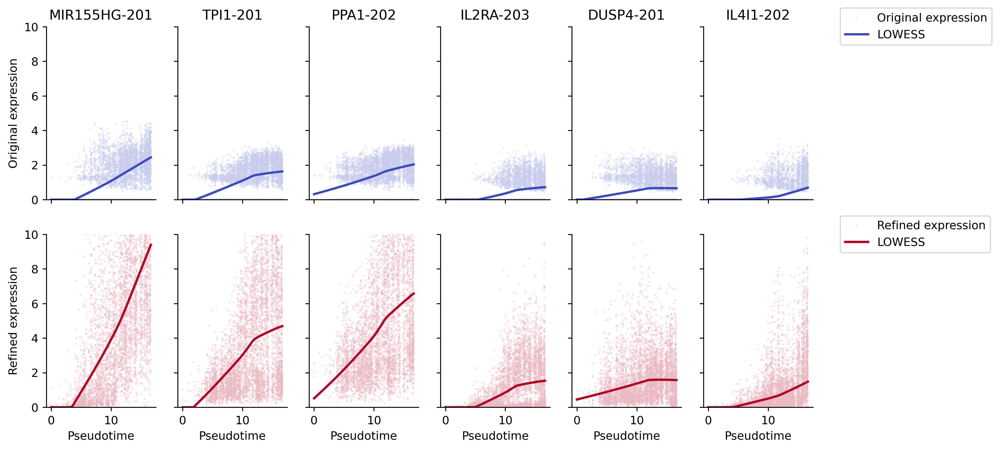

In [11]:
isoform_names = ['MIR155HG-201','TPI1-201','PPA1-202',  'IL2RA-203', 'DUSP4-201', 'IL4I1-202']

adata_raw, adata_refined, pseudotime_metadata = read_data('8fc', '20230222')
adata_w_refined = adata_refined[adata_refined.obs["condition_time"].str.endswith("PGE2")].copy()

adata_wo_refined = adata_refined[~adata_refined.obs["condition_time"].str.endswith("PGE2")].copy()

adata_w_raw = adata_raw[adata_raw.obs["condition_time"].str.endswith("PGE2")].copy()

adata_wo_raw = adata_raw[~adata_raw.obs["condition_time"].str.endswith("PGE2")].copy()

plot_isoform_expression_and_regression(adata_wo_raw, adata_wo_refined, isoform_names)


/usr/local/lib/python3.12/dist-packages/scanpy/preprocessing/_normalization.py:269: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/tmp/ipython-input-762459732.py:19: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_refined.obs['pseudotime'] = pseudotime_metadata.set_index('cell_names')['pseudotime'].loc[adata_refined.obs.index].values


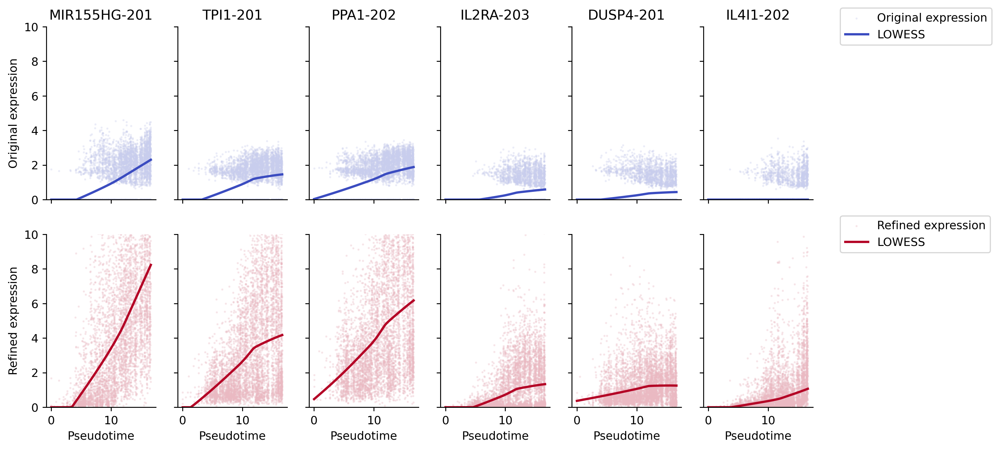

In [12]:
isoform_names = ['MIR155HG-201','TPI1-201','PPA1-202',  'IL2RA-203', 'DUSP4-201', 'IL4I1-202']


adata_raw, adata_refined, pseudotime_metadata = read_data('4fc', '20230222')
adata_w_refined = adata_refined[adata_refined.obs["condition_time"].str.endswith("PGE2")].copy()

adata_wo_refined = adata_refined[~adata_refined.obs["condition_time"].str.endswith("PGE2")].copy()

adata_w_raw = adata_raw[adata_raw.obs["condition_time"].str.endswith("PGE2")].copy()

adata_wo_raw = adata_raw[~adata_raw.obs["condition_time"].str.endswith("PGE2")].copy()

plot_isoform_expression_and_regression(adata_wo_raw, adata_wo_refined, isoform_names)

/usr/local/lib/python3.12/dist-packages/scanpy/preprocessing/_normalization.py:269: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/tmp/ipython-input-762459732.py:19: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_refined.obs['pseudotime'] = pseudotime_metadata.set_index('cell_names')['pseudotime'].loc[adata_refined.obs.index].values


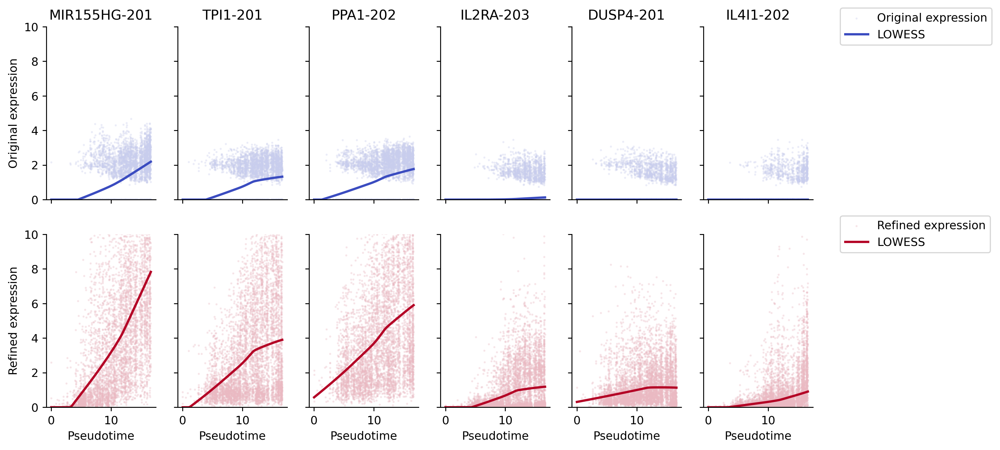

In [13]:
isoform_names = ['MIR155HG-201','TPI1-201','PPA1-202',  'IL2RA-203', 'DUSP4-201', 'IL4I1-202']


adata_raw, adata_refined, pseudotime_metadata = read_data('2fc', '20230222')
adata_w_refined = adata_refined[adata_refined.obs["condition_time"].str.endswith("PGE2")].copy()

adata_wo_refined = adata_refined[~adata_refined.obs["condition_time"].str.endswith("PGE2")].copy()

adata_w_raw = adata_raw[adata_raw.obs["condition_time"].str.endswith("PGE2")].copy()

adata_wo_raw = adata_raw[~adata_raw.obs["condition_time"].str.endswith("PGE2")].copy()

plot_isoform_expression_and_regression(adata_wo_raw, adata_wo_refined, isoform_names)

# CREM isoforms

8fc

/usr/local/lib/python3.12/dist-packages/scanpy/preprocessing/_normalization.py:269: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/tmp/ipython-input-762459732.py:19: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_refined.obs['pseudotime'] = pseudotime_metadata.set_index('cell_names')['pseudotime'].loc[adata_refined.obs.index].values


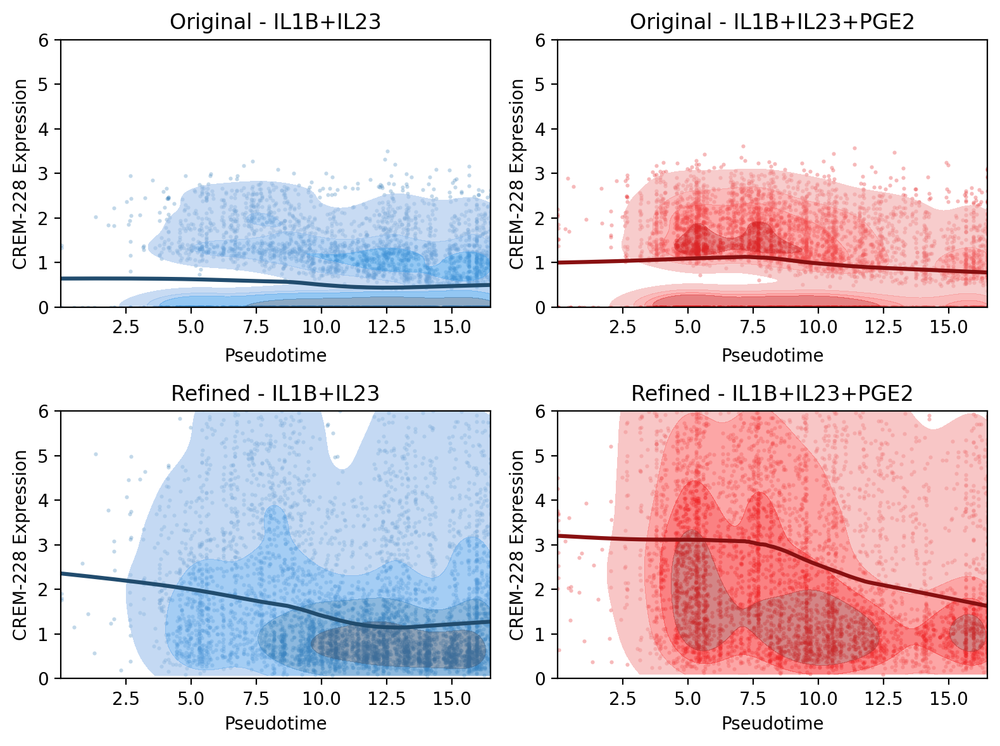

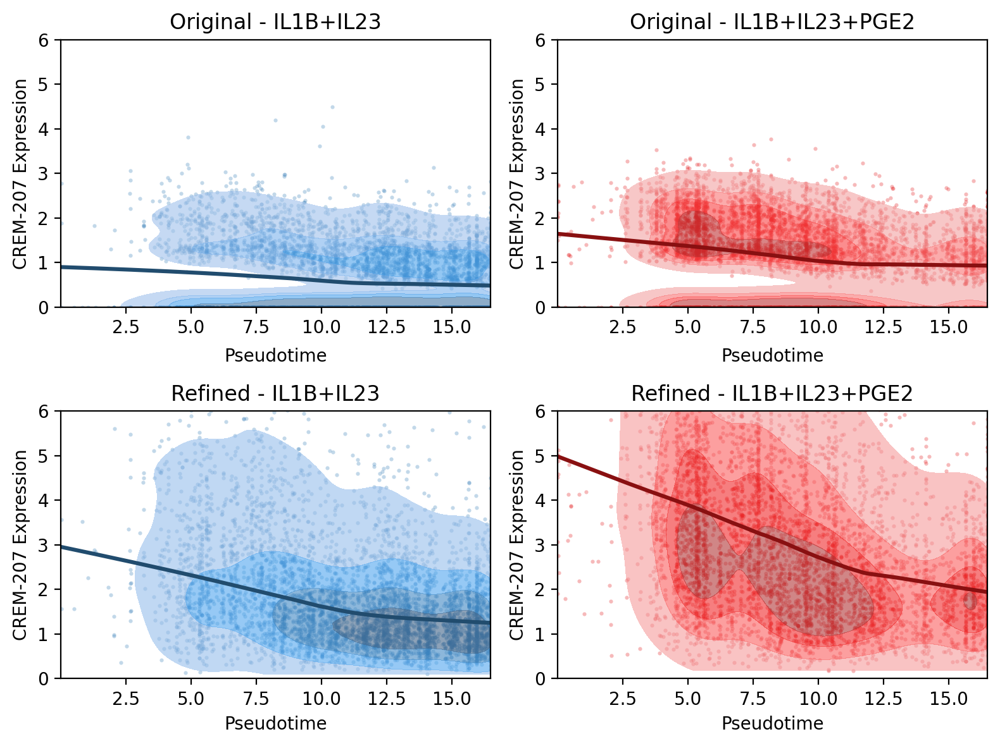

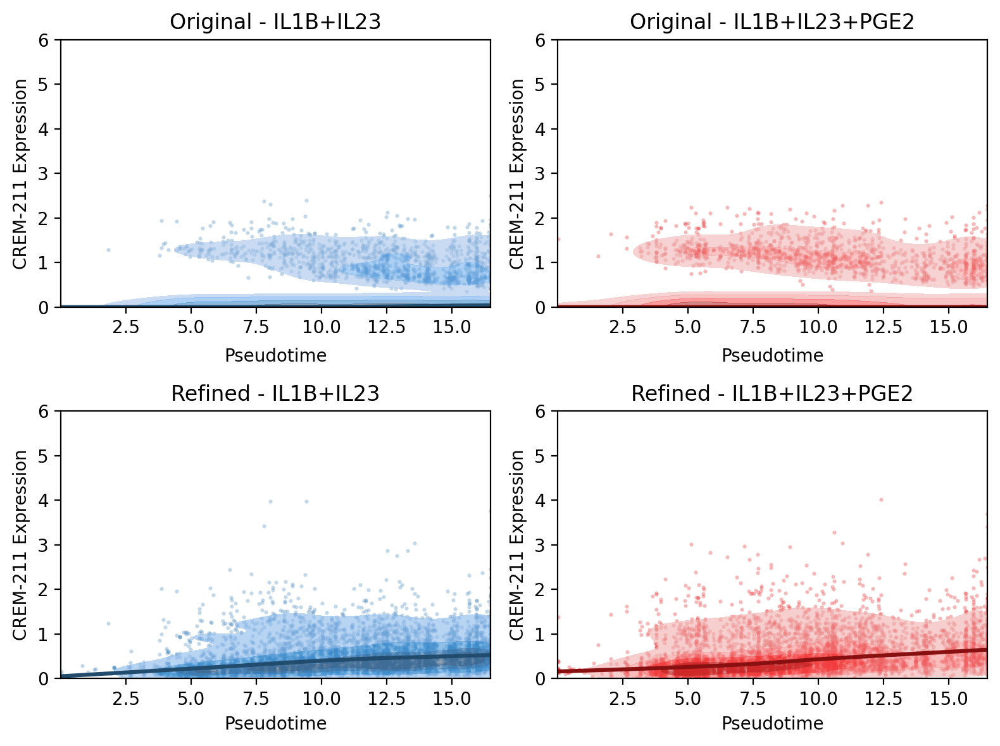

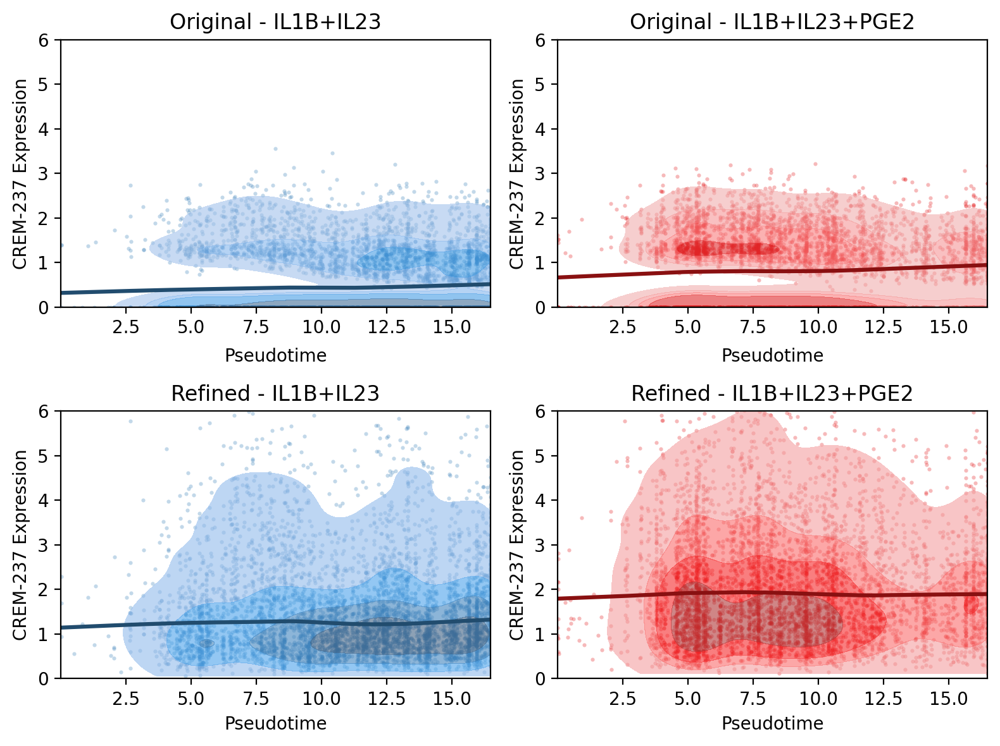

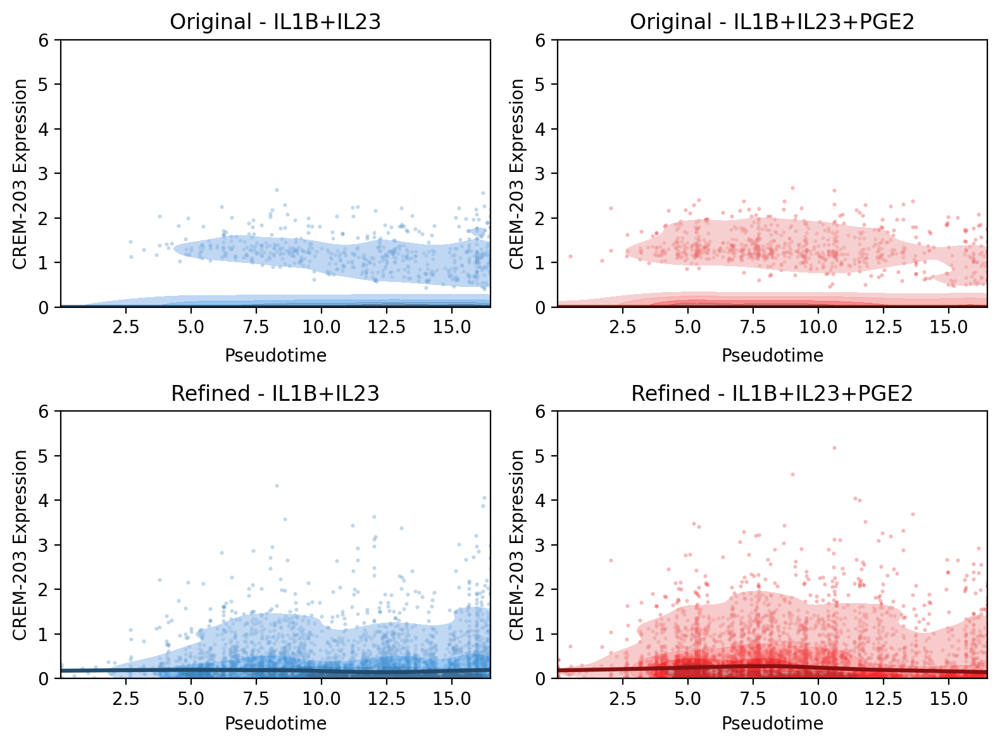

In [14]:
adata_raw, adata_refined, pseudotime_metadata = read_data('8fc', '20230222')

adata_w_refined = adata_refined[adata_refined.obs["condition_time"].str.endswith("PGE2")].copy()

adata_wo_refined = adata_refined[~adata_refined.obs["condition_time"].str.endswith("PGE2")].copy()

adata_w_raw = adata_raw[adata_raw.obs["condition_time"].str.endswith("PGE2")].copy()

adata_wo_raw = adata_raw[~adata_raw.obs["condition_time"].str.endswith("PGE2")].copy()

adata_dict = {
    'with_pge2': (adata_w_raw,  adata_w_refined),
    'no_pge2':   (adata_wo_raw, adata_wo_refined),
}

isoform_names = ['CREM-228','CREM-207', 'CREM-211','CREM-237', 'CREM-203']

for iso in isoform_names:
    plot_isoform_2x2(adata_dict, iso, ylim=(0,6))

4fc

/usr/local/lib/python3.12/dist-packages/scanpy/preprocessing/_normalization.py:269: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/tmp/ipython-input-762459732.py:19: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_refined.obs['pseudotime'] = pseudotime_metadata.set_index('cell_names')['pseudotime'].loc[adata_refined.obs.index].values


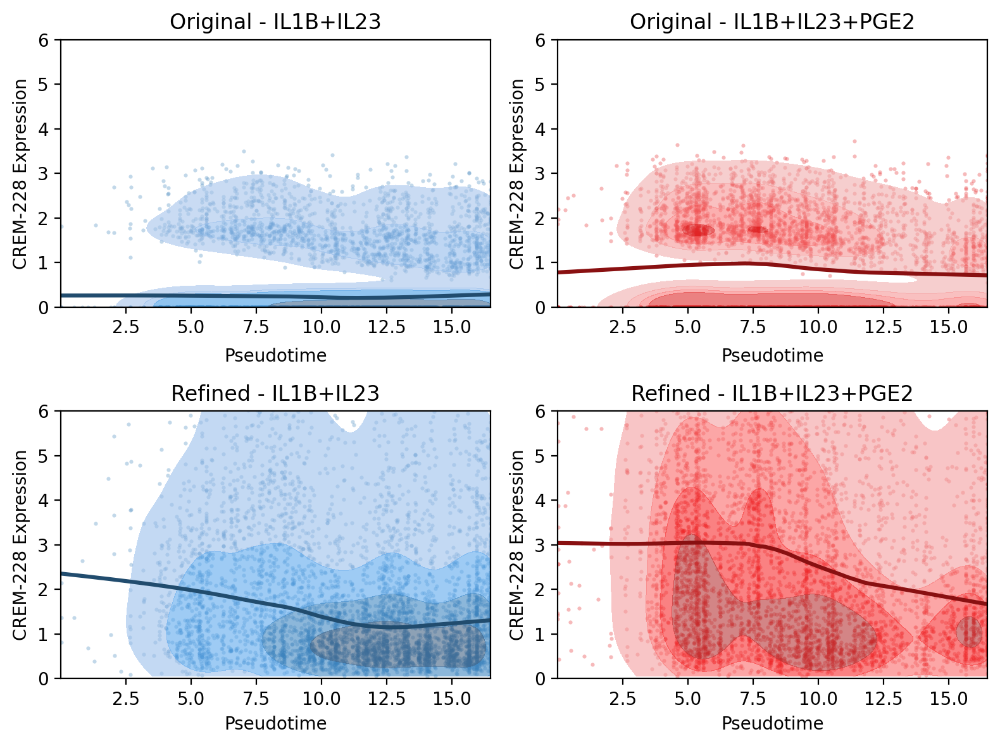

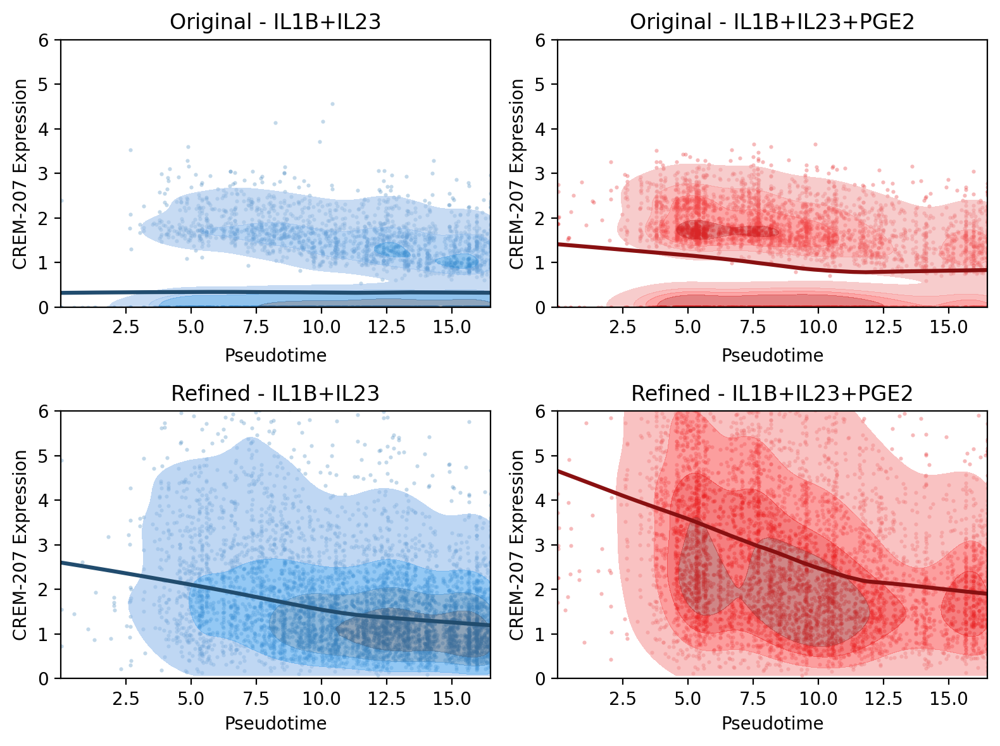

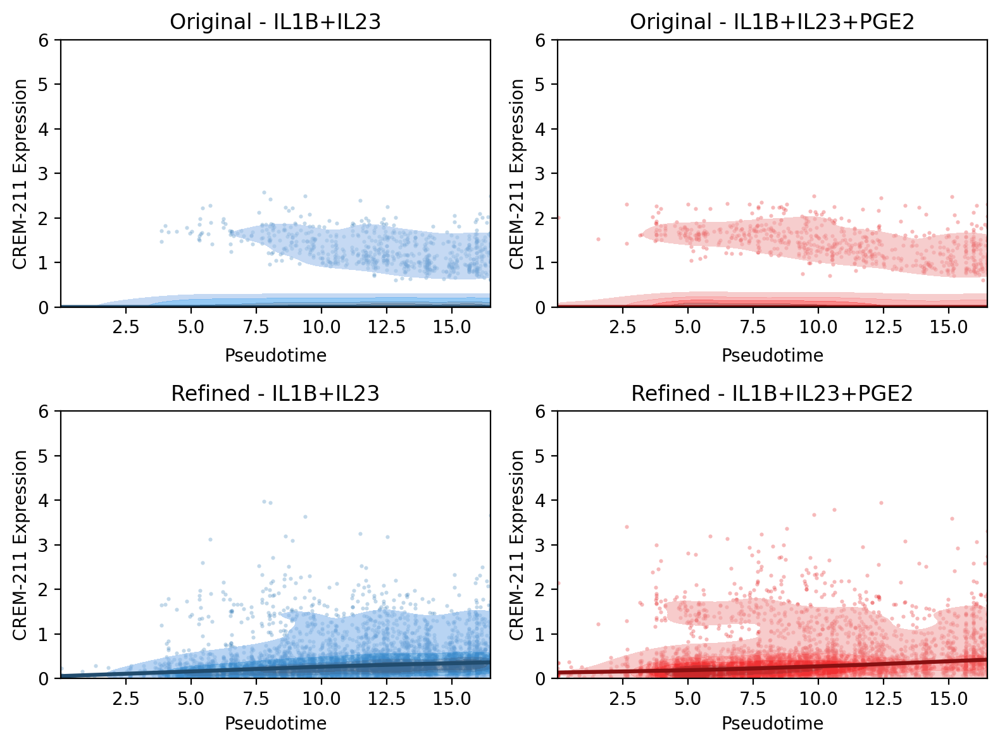

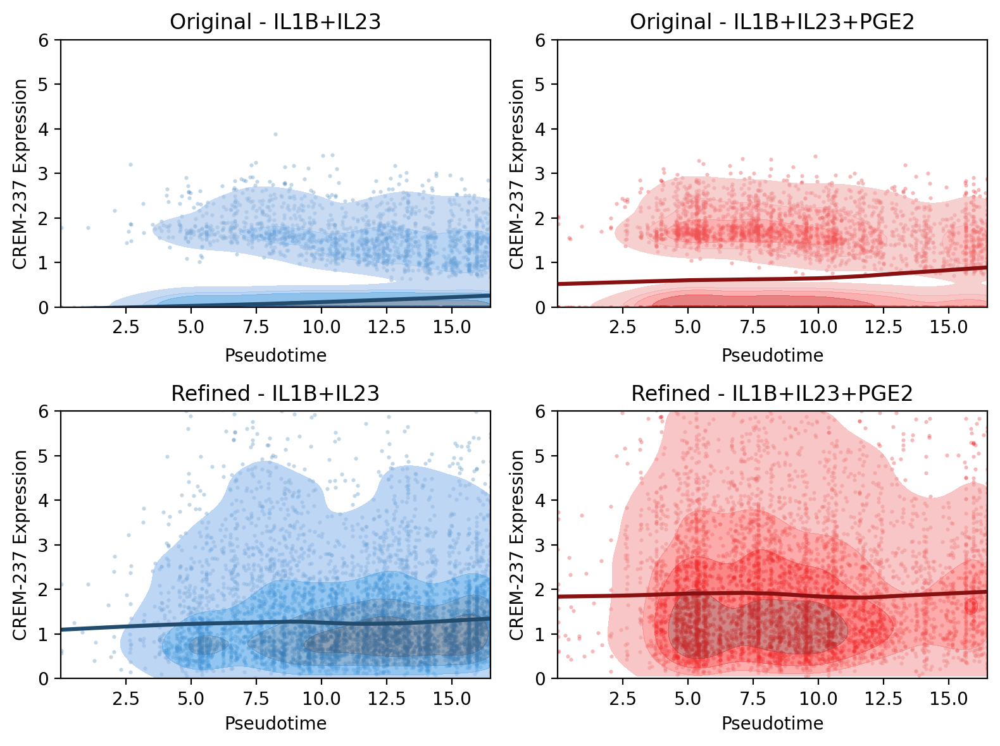

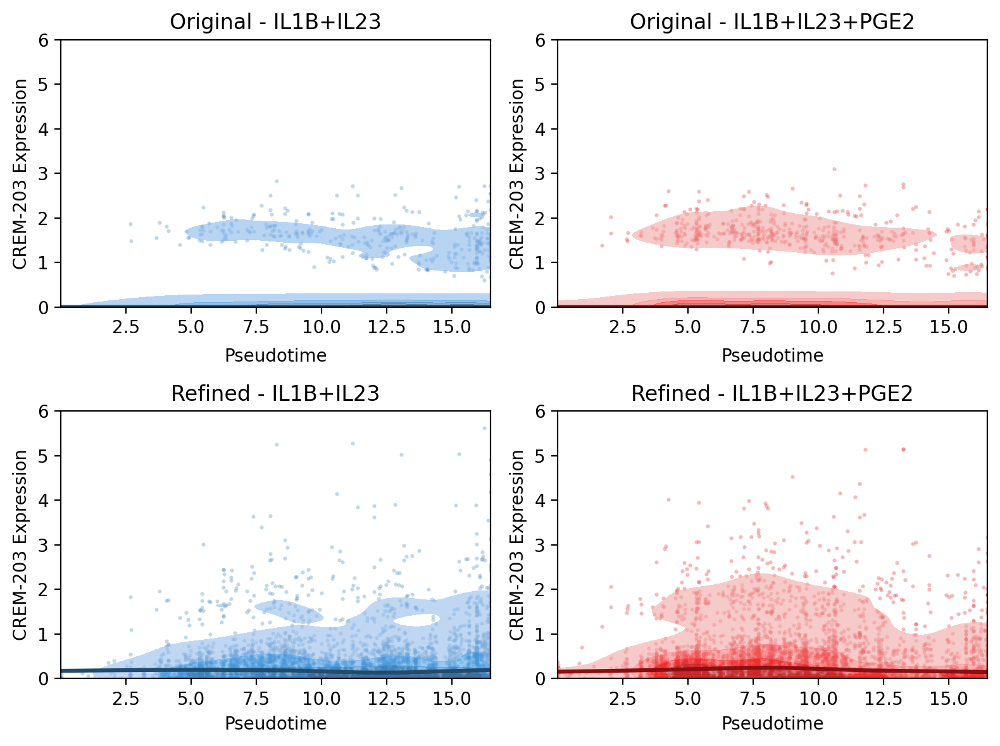

In [15]:
adata_raw, adata_refined, pseudotime_metadata = read_data('4fc', '20230222')

adata_w_refined = adata_refined[adata_refined.obs["condition_time"].str.endswith("PGE2")].copy()

adata_wo_refined = adata_refined[~adata_refined.obs["condition_time"].str.endswith("PGE2")].copy()

adata_w_raw = adata_raw[adata_raw.obs["condition_time"].str.endswith("PGE2")].copy()

adata_wo_raw = adata_raw[~adata_raw.obs["condition_time"].str.endswith("PGE2")].copy()

adata_dict = {
    'with_pge2': (adata_w_raw,  adata_w_refined),
    'no_pge2':   (adata_wo_raw, adata_wo_refined),
}

isoform_names = ['CREM-228','CREM-207', 'CREM-211','CREM-237', 'CREM-203']

for iso in isoform_names:
    plot_isoform_2x2(adata_dict, iso, ylim=(0,6))

2fc

/usr/local/lib/python3.12/dist-packages/scanpy/preprocessing/_normalization.py:269: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/tmp/ipython-input-762459732.py:19: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_refined.obs['pseudotime'] = pseudotime_metadata.set_index('cell_names')['pseudotime'].loc[adata_refined.obs.index].values


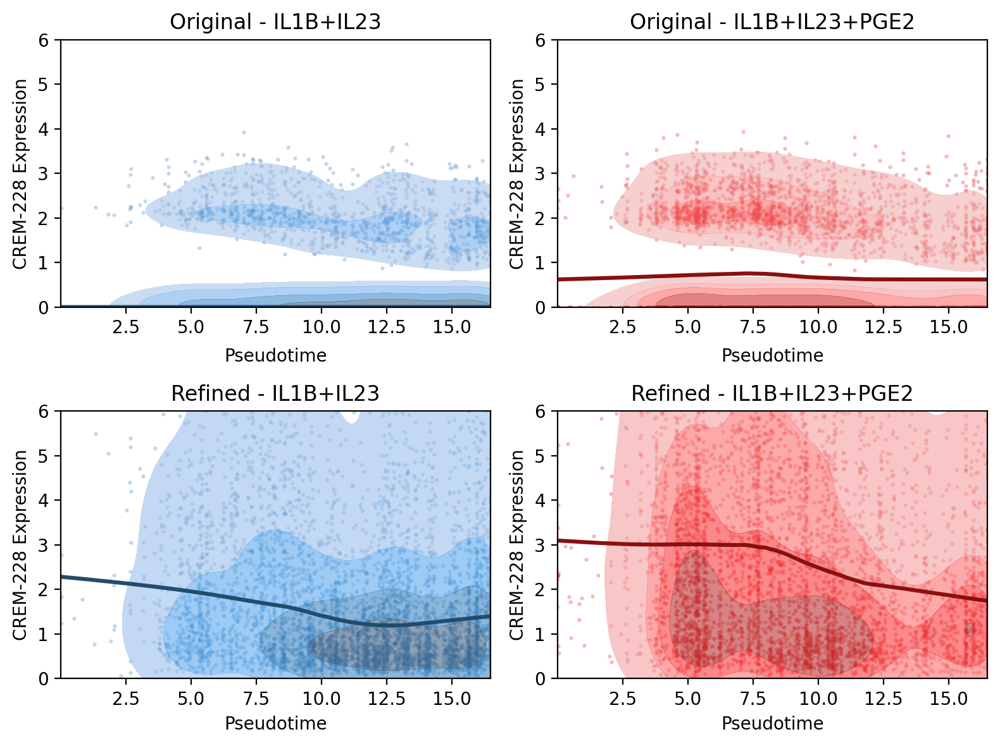

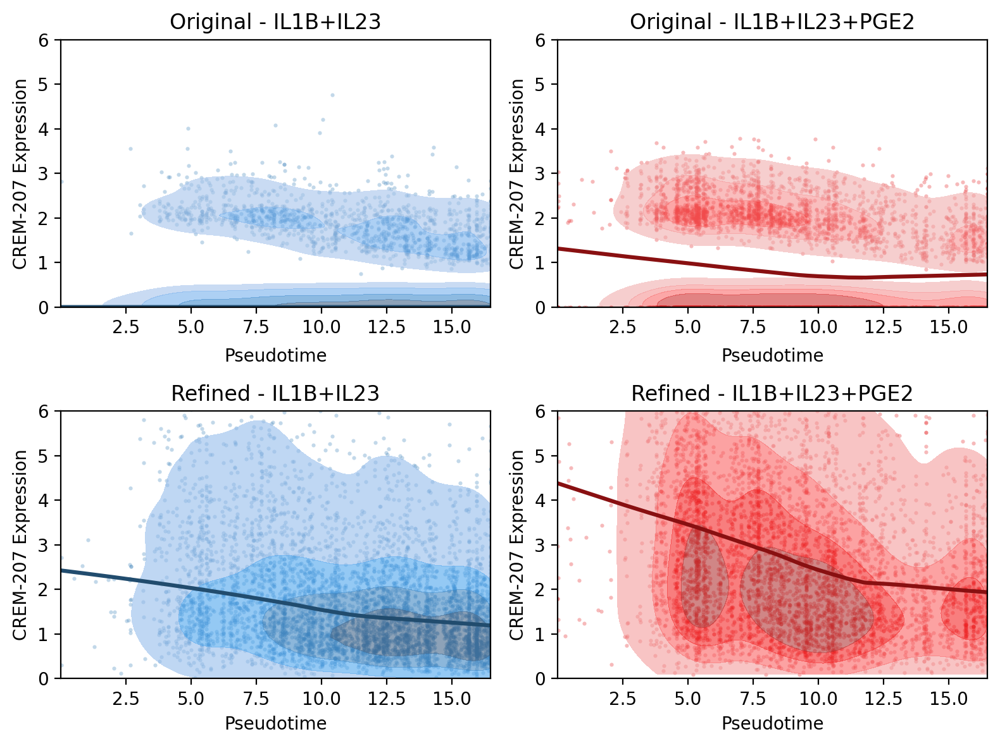

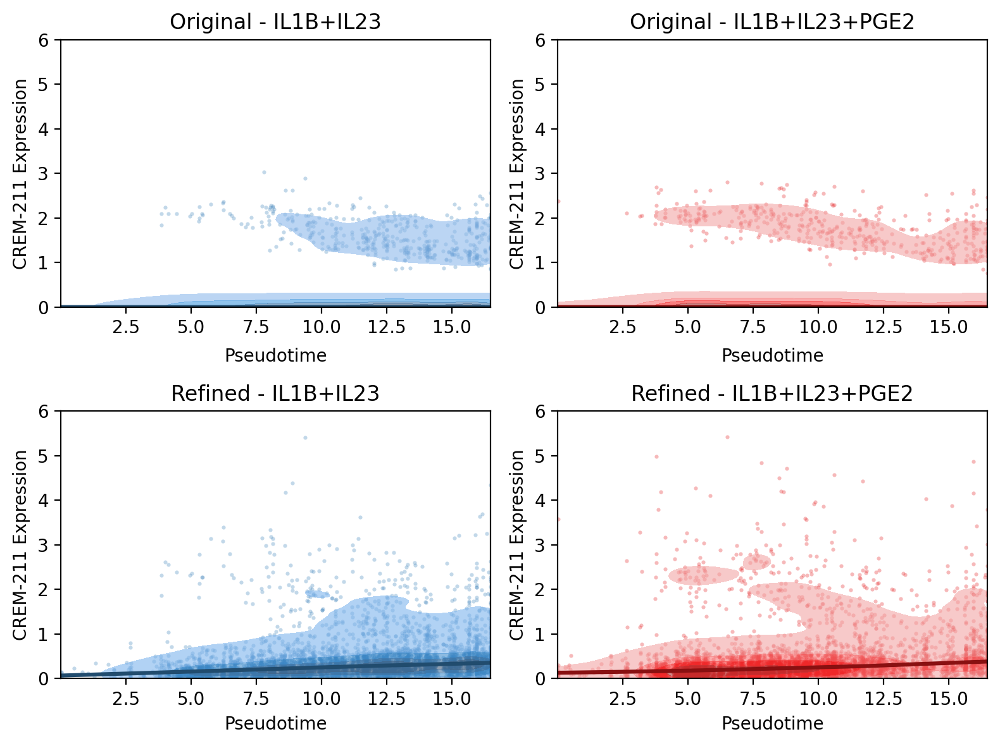

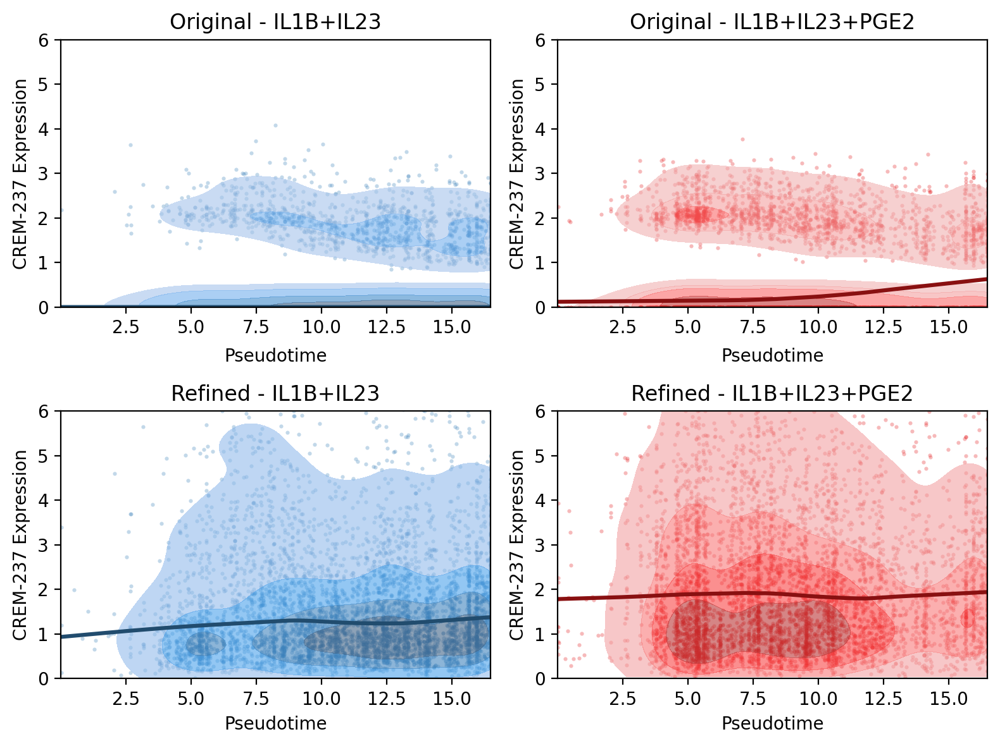

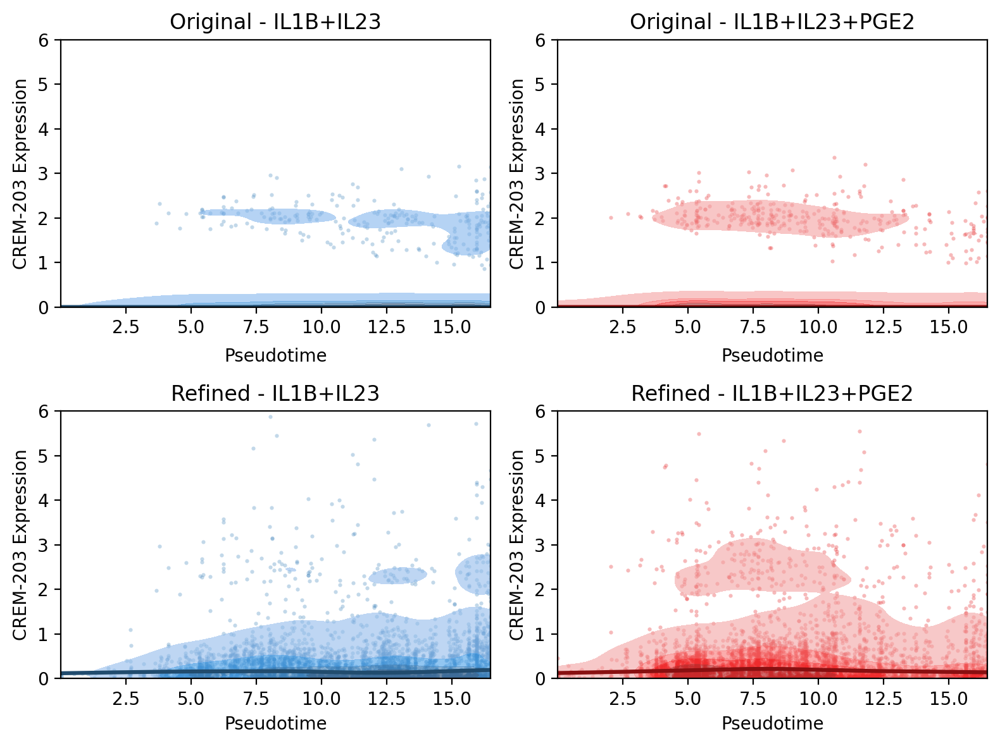

In [16]:
adata_raw, adata_refined, pseudotime_metadata = read_data('2fc', '20230222')

adata_w_refined = adata_refined[adata_refined.obs["condition_time"].str.endswith("PGE2")].copy()

adata_wo_refined = adata_refined[~adata_refined.obs["condition_time"].str.endswith("PGE2")].copy()

adata_w_raw = adata_raw[adata_raw.obs["condition_time"].str.endswith("PGE2")].copy()

adata_wo_raw = adata_raw[~adata_raw.obs["condition_time"].str.endswith("PGE2")].copy()

adata_dict = {
    'with_pge2': (adata_w_raw,  adata_w_refined),
    'no_pge2':   (adata_wo_raw, adata_wo_refined),
}

isoform_names = ['CREM-228','CREM-207', 'CREM-211','CREM-237', 'CREM-203']

for iso in isoform_names:
    plot_isoform_2x2(adata_dict, iso, ylim=(0,6))